<a href="https://colab.research.google.com/github/juliacamposn/classificador-de-imagens/blob/main/trabalho_1_ia_model2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import urllib.request
import os
from PIL import Image,ImageStat
import numpy as np
import matplotlib.pyplot as plt
import torchvision
import torch
import torch.nn as nn
from torch.utils.data import  DataLoader
import torchvision.transforms as transforms
from torch import optim
import sklearn.metrics as metrics
import torch.nn.functional as F
from torchvision import models

#Rede Convolucional

In [ ]:
conv1 = nn.Conv2d(in_channels=3,out_channels=6,kernel_size=5,stride=1,padding=0)
conv2 = nn.Conv2d(in_channels=6,out_channels=16,kernel_size=5,stride=1,padding=0)
relu = nn.ReLU()
maxpool = nn.MaxPool2d(kernel_size=2,stride=2,padding=0)
flatten = nn.Flatten()
fc1 = nn.Linear(18496,120)
fc2 = nn.Linear(120,84)
fc3 = nn.Linear(84,10)

In [ ]:
x = torch.randn(1,3,150,150)
x = conv1(x)
x = relu(x)
x = maxpool(x)
x = conv2(x)
x = relu(x)
x = maxpool(x)
x = flatten(x)
x = fc1(x)
x = relu(x)
x = fc2(x)
x = relu(x)
x = fc3(x)

In [ ]:
x.shape

torch.Size([1, 10])

In [ ]:
class LeNet(nn.Module):
    def __init__(self):
        super(LeNet,self).__init__()
        self.conv1 = nn.Conv2d(in_channels=3,out_channels=6,kernel_size=5,stride=1,padding=0)
        self.conv2 = nn.Conv2d(in_channels=6,out_channels=16,kernel_size=5,stride=1,padding=0)
        self.relu = nn.ReLU()
        self.maxpool = nn.MaxPool2d(kernel_size=2,stride=2,padding=0)
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(1296,120)
        self.fc2 = nn.Linear(120,84)
        self.fc3 = nn.Linear(84,5)

    def forward(self,x):
        x = self.conv1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        x = self.conv2(x)
        x = self.relu(x)
        x = self.maxpool(x)
        x = self.flatten(x)
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        x = self.relu(x)
        x = self.fc3(x)

        return x


In [ ]:
model = LeNet()

In [ ]:
model

LeNet(
  (conv1): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
  (relu): ReLU()
  (maxpool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc1): Linear(in_features=1296, out_features=120, bias=True)
  (fc2): Linear(in_features=120, out_features=84, bias=True)
  (fc3): Linear(in_features=84, out_features=5, bias=True)
)

In [ ]:
x = torch.rand((1,3,50,50))

In [ ]:
model(x)

tensor([[ 0.0683,  0.0295,  0.0869, -0.0461, -0.0315]],
       grad_fn=<AddmmBackward0>)

In [ ]:
import torchsummary

In [ ]:
torchsummary.summary(model,(3,50,50),device='cpu')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 6, 46, 46]             456
              ReLU-2            [-1, 6, 46, 46]               0
         MaxPool2d-3            [-1, 6, 23, 23]               0
            Conv2d-4           [-1, 16, 19, 19]           2,416
              ReLU-5           [-1, 16, 19, 19]               0
         MaxPool2d-6             [-1, 16, 9, 9]               0
           Flatten-7                 [-1, 1296]               0
            Linear-8                  [-1, 120]         155,640
              ReLU-9                  [-1, 120]               0
           Linear-10                   [-1, 84]          10,164
             ReLU-11                   [-1, 84]               0
           Linear-12                    [-1, 5]             425
Total params: 169,101
Trainable params: 169,101
Non-trainable params: 0
-------------------------------

In [ ]:
model

LeNet(
  (conv1): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
  (relu): ReLU()
  (maxpool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc1): Linear(in_features=1296, out_features=120, bias=True)
  (fc2): Linear(in_features=120, out_features=84, bias=True)
  (fc3): Linear(in_features=84, out_features=5, bias=True)
)

In [ ]:
import torchsummary

In [ ]:
x = torch.randn(10,3,50,50)

In [ ]:
model = LeNet()


In [ ]:
model(x)

tensor([[ 0.0496, -0.0077, -0.0989,  0.0214, -0.1315],
        [ 0.0425,  0.0085, -0.0883,  0.0352, -0.1373],
        [ 0.0572, -0.0176, -0.0870,  0.0437, -0.1347],
        [ 0.0207, -0.0474, -0.1019,  0.0404, -0.1511],
        [ 0.0173, -0.0129, -0.0942,  0.0462, -0.1298],
        [ 0.0574, -0.0215, -0.1127,  0.0488, -0.1258],
        [ 0.0299, -0.0129, -0.1014,  0.0583, -0.1051],
        [ 0.0300, -0.0125, -0.0884,  0.0451, -0.1064],
        [ 0.0376, -0.0055, -0.0879,  0.0262, -0.1345],
        [ 0.0584, -0.0184, -0.0994,  0.0249, -0.1394]],
       grad_fn=<AddmmBackward0>)

In [ ]:
class LeNet2(nn.Module):
    def __init__(self):
        super(LeNet2,self).__init__()
        self.backbone = nn.Sequential(
            nn.Conv2d(in_channels=3,out_channels=6,kernel_size=5,stride=1,padding=0),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2,stride=2,padding=0),
            nn.Conv2d(in_channels=6,out_channels=16,kernel_size=5,stride=1,padding=0),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2,stride=2,padding=0),
            nn.Flatten()
        )
        self.classifier = nn.Sequential(
            nn.Linear(1296,120),
            nn.ReLU(),
            nn.Linear(120,84),
            nn.ReLU(),
            nn.Linear(84,2),
        )


    def forward(self,x):
        x = self.backbone(x)
        x = self.classifier(x)
        return x

In [ ]:
model = LeNet2()

In [ ]:
model.to('cuda:0')

LeNet2(
  (backbone): Sequential(
    (0): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Flatten(start_dim=1, end_dim=-1)
  )
  (classifier): Sequential(
    (0): Linear(in_features=1296, out_features=120, bias=True)
    (1): ReLU()
    (2): Linear(in_features=120, out_features=84, bias=True)
    (3): ReLU()
    (4): Linear(in_features=84, out_features=2, bias=True)
  )
)

In [ ]:
model.classifier = nn.Sequential(nn.Linear(1296, 2).to('cuda:0')).to('cuda:0')

In [ ]:
model

LeNet2(
  (backbone): Sequential(
    (0): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Flatten(start_dim=1, end_dim=-1)
  )
  (classifier): Sequential(
    (0): Linear(in_features=1296, out_features=2, bias=True)
  )
)

In [ ]:
model.classifier[0] = nn.Linear(1296,2)

In [ ]:
model = torchvision.models.mobilenet_v3_large(weights = torchvision.models.MobileNet_V3_Large_Weights.IMAGENET1K_V2)

Downloading: "https://download.pytorch.org/models/mobilenet_v3_large-5c1a4163.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_large-5c1a4163.pth
100%|██████████| 21.1M/21.1M [00:00<00:00, 69.2MB/s]


In [ ]:
model

MobileNetV3(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      (2): Hardswish()
    )
    (1): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
        (1): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
        )
      )
    )
    (2): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1), bi

In [ ]:
model.classifier[1] = nn.Linear(in_features=1280, out_features=3)

In [ ]:
model = models.mobilenet_v3_large(pretrained=True)
model.classifier[3] = torch.nn.Linear(model.classifier[3].in_features, 3)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V3_Large_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V3_Large_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v3_large-8738ca79.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_large-8738ca79.pth
100%|██████████| 21.1M/21.1M [00:00<00:00, 140MB/s]


In [ ]:
model

MobileNetV3(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      (2): Hardswish()
    )
    (1): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
        (1): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
        )
      )
    )
    (2): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1), bi

## **Criando o dataset**

In [ ]:
def download_images(main_dir,urls_filename):
    class_name = urls_filename.split('.')[-2]
    output_dir = main_dir+os.sep+class_name
    os.makedirs(output_dir,exist_ok=True)
    with open(urls_filename) as f:
        for url in f:
            img_filename = url.split('/')[-1].replace("\n","")
            print(img_filename)
            try:
                response = urllib.request.urlopen(url)
                open(output_dir+'/'+img_filename,mode="wb+").write(response.read())
            except:
                print('nao conseguiu baixar ',url)

In [ ]:
!pwd

/content


In [ ]:
main_dir = "/content/drive/MyDrive/abobrinhas"

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import csv
from datetime import datetime

# Caminho da pasta principal onde estão as subpastas com fotos
main_folder = '/content/drive/MyDrive/abobrinhas'

# Iterar sobre cada subpasta dentro da pasta principal
for subfolder in os.listdir(main_folder):
    subfolder_path = os.path.join(main_folder, subfolder)

    if os.path.isdir(subfolder_path):  # Verifica se é uma pasta
        # Nome do CSV será o nome da subpasta
        output_csv = f"{subfolder}.csv"

        # Criação do arquivo CSV
        with open(output_csv, mode='w', newline='') as file:
            writer = csv.writer(file)
            writer.writerow(["Nome do Arquivo", "Data de Criação", "Caminho Completo"])

            # Iterar sobre os arquivos na subpasta
            for filename in os.listdir(subfolder_path):
                file_path = os.path.join(subfolder_path, filename)
                if os.path.isfile(file_path):  # Verifica se é um arquivo
                    creation_time = os.path.getctime(file_path)
                    creation_date = datetime.fromtimestamp(creation_time).strftime('%Y-%m-%d %H:%M:%S')

                    # Escrever as informações no arquivo CSV
                    writer.writerow([filename, creation_date, file_path])

        print(f"Arquivo CSV gerado para a subpasta {subfolder}!")



Arquivo CSV gerado para a subpasta abobrinha_brasileira!
Arquivo CSV gerado para a subpasta abobrinha_italiana!
Arquivo CSV gerado para a subpasta abobrinha_paulista!


In [ ]:
os.chdir(main_dir)

In [ ]:
!ls

abobrinha_brasileira	  abobrinha_italiana	  abobrinha_paulista	  best_model.pth
abobrinha_brasileira.csv  abobrinha_italiana.csv  abobrinha_paulista.csv


In [ ]:
#download_images(main_dir,'abobrinha_brasileira.csv') #deixa comentado se não faz download +1 vez

In [ ]:
import torch
from torchvision import transforms, datasets

transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

image_dataset = datasets.ImageFolder(root=main_dir, transform=transform)

In [ ]:
x,y = next(iter(image_dataset))

In [ ]:
x

tensor([[[ 0.8789,  0.8789,  0.8618,  ...,  0.7419,  0.7591,  0.7762],
         [ 0.8961,  0.8961,  0.8961,  ...,  0.7419,  0.7591,  0.7762],
         [ 0.8789,  0.8961,  0.8961,  ...,  0.7591,  0.7591,  0.7762],
         ...,
         [ 0.8104,  0.8276,  0.8276,  ..., -0.1828, -0.1999, -0.2171],
         [ 0.8789,  0.8789,  0.8789,  ..., -0.1657, -0.1828, -0.1999],
         [ 0.9132,  0.8961,  0.8961,  ..., -0.1657, -0.1657, -0.1828]],

        [[ 0.9230,  0.9230,  0.9055,  ..., -0.8803, -0.8627, -0.8627],
         [ 0.9055,  0.9055,  0.9055,  ..., -0.8627, -0.8627, -0.8627],
         [ 0.8880,  0.8880,  0.9055,  ..., -0.8452, -0.8452, -0.8277],
         ...,
         [-1.0203, -0.9853, -0.9853,  ..., -0.7402, -0.7577, -0.7927],
         [-0.9328, -0.9153, -0.8978,  ..., -0.6877, -0.7052, -0.7402],
         [-0.8627, -0.8452, -0.8277,  ..., -0.6527, -0.6877, -0.7227]],

        [[ 1.1411,  1.1411,  1.1237,  ..., -0.5147, -0.4973, -0.4973],
         [ 1.1237,  1.1411,  1.1411,  ..., -0

In [ ]:
y

0

In [ ]:
dir(image_dataset)

['__add__',
 '__annotations__',
 '__class__',
 '__class_getitem__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__len__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__orig_bases__',
 '__parameters__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__slots__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_format_transform_repr',
 '_is_protocol',
 '_repr_indent',
 'class_to_idx',
 'classes',
 'extensions',
 'extra_repr',
 'find_classes',
 'imgs',
 'loader',
 'make_dataset',
 'root',
 'samples',
 'target_transform',
 'targets',
 'transform',
 'transforms']

In [ ]:
#para ver as classes
image_dataset.classes

['abobrinha_brasileira', 'abobrinha_italiana', 'abobrinha_paulista']

In [ ]:
#para ver como será classificada as imagens
image_dataset.class_to_idx

{'abobrinha_brasileira': 0, 'abobrinha_italiana': 1, 'abobrinha_paulista': 2}

In [ ]:
image_dataset.targets[0]

0

In [ ]:
image_dataset[0]

(tensor([[[ 0.8789,  0.8789,  0.8618,  ...,  0.7419,  0.7591,  0.7762],
          [ 0.8961,  0.8961,  0.8961,  ...,  0.7419,  0.7591,  0.7762],
          [ 0.8789,  0.8961,  0.8961,  ...,  0.7591,  0.7591,  0.7762],
          ...,
          [ 0.8104,  0.8276,  0.8276,  ..., -0.1828, -0.1999, -0.2171],
          [ 0.8789,  0.8789,  0.8789,  ..., -0.1657, -0.1828, -0.1999],
          [ 0.9132,  0.8961,  0.8961,  ..., -0.1657, -0.1657, -0.1828]],
 
         [[ 0.9230,  0.9230,  0.9055,  ..., -0.8803, -0.8627, -0.8627],
          [ 0.9055,  0.9055,  0.9055,  ..., -0.8627, -0.8627, -0.8627],
          [ 0.8880,  0.8880,  0.9055,  ..., -0.8452, -0.8452, -0.8277],
          ...,
          [-1.0203, -0.9853, -0.9853,  ..., -0.7402, -0.7577, -0.7927],
          [-0.9328, -0.9153, -0.8978,  ..., -0.6877, -0.7052, -0.7402],
          [-0.8627, -0.8452, -0.8277,  ..., -0.6527, -0.6877, -0.7227]],
 
         [[ 1.1411,  1.1411,  1.1237,  ..., -0.5147, -0.4973, -0.4973],
          [ 1.1237,  1.1411,

In [ ]:
#download_images(main_dir,'abobrinha_brasileira.csv')
#download_images(main_dir,'abobrinha_italiana.csv')
#download_images(main_dir,'abobrinha_paulista.csv')

In [ ]:
device = torch.device('cuda:0')
model.to(device)

MobileNetV3(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      (2): Hardswish()
    )
    (1): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
        (1): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
        )
      )
    )
    (2): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1), bi

# construção do loader

In [ ]:
def image_loader(img):
    return Image.open(img).convert("RGB")

In [ ]:
img = image_loader('./abobrinha_italiana/20241023_142320.jpg')

In [ ]:
tconvert = transforms.Resize((255,255))

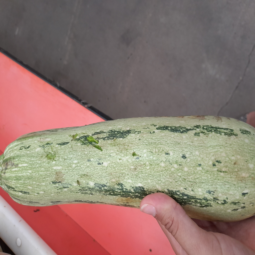

In [ ]:
tconvert(img)

In [ ]:
tconvert2 = transforms.CenterCrop((227,227))

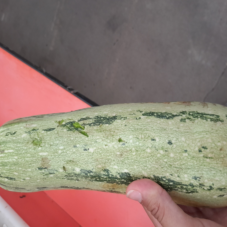

In [ ]:
tconvert2(tconvert(img))

In [ ]:
img_tensor = transform(img)

In [ ]:
img_tensor

tensor([[[-0.5424, -0.5424, -0.5424,  ..., -0.1828, -0.1657, -0.1143],
         [-0.5253, -0.5253, -0.5424,  ..., -0.1486, -0.1486, -0.1486],
         [-0.5596, -0.5596, -0.5596,  ..., -0.0972, -0.0972, -0.1314],
         ...,
         [-0.1143, -0.2342, -0.7479,  ..., -0.0116, -0.0287, -0.0801],
         [ 0.1768,  0.1597,  0.1426,  ...,  0.0056, -0.0116, -0.0287],
         [ 0.2453,  0.2453,  0.2453,  ...,  0.0398,  0.0056,  0.0056]],

        [[-0.5301, -0.5301, -0.5301,  ..., -0.1450, -0.1275, -0.0574],
         [-0.5126, -0.5126, -0.5301,  ..., -0.1099, -0.1099, -0.1099],
         [-0.5126, -0.5301, -0.5476,  ..., -0.0574, -0.0574, -0.1099],
         ...,
         [-0.3901, -0.4601, -0.8627,  ..., -0.5301, -0.5826, -0.6527],
         [-0.1975, -0.1975, -0.1625,  ..., -0.4951, -0.5301, -0.5651],
         [-0.2150, -0.1800, -0.1800,  ..., -0.4951, -0.5126, -0.5126]],

        [[-0.3230, -0.3055, -0.3055,  ...,  0.1651,  0.1825,  0.1825],
         [-0.3055, -0.2881, -0.3055,  ...,  0

In [ ]:
img_tensor.shape

torch.Size([3, 224, 224])

# Construção da classe dataset

In [ ]:
dataset = image_dataset

In [ ]:
len(dataset)

647

In [ ]:
np.unique(dataset.targets,return_counts=True)

(array([0, 1, 2]), array([224, 214, 209]))

In [ ]:
dataset.targets = torch.tensor(dataset.targets)

# Treinamento da rede

In [ ]:
ds = image_dataset

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
np.unique(ds.targets, return_counts=True)

(array([0, 1, 2]), array([224, 214, 209]))

In [ ]:
ds

Dataset ImageFolder
    Number of datapoints: 647
    Root location: /content/drive/MyDrive/abobrinhas
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )

In [ ]:
ds.targets = np.array(ds.targets)

In [ ]:
bs = 128
train_idx, temp_idx = train_test_split(np.arange(len(ds)),test_size=0.3,shuffle=True,stratify=ds.targets)
valid_idx, test_idx = train_test_split(temp_idx,test_size=0.5,shuffle=True,stratify=ds.targets[temp_idx])

train_sampler = torch.utils.data.SubsetRandomSampler(train_idx)
valid_sampler = torch.utils.data.SubsetRandomSampler(valid_idx)
test_sampler  = torch.utils.data.SubsetRandomSampler(test_idx)

dl_train = torch.utils.data.DataLoader(ds,batch_size=bs,sampler=train_sampler)
dl_valid = torch.utils.data.DataLoader(ds,batch_size=bs,sampler=valid_sampler)
dl_test  = torch.utils.data.DataLoader(ds,batch_size=bs,sampler=test_sampler)

In [ ]:
np.unique(ds.targets[train_idx], return_counts=True)

(array([0, 1, 2]), array([156, 150, 146]))

In [ ]:
np.unique(ds.targets[valid_idx], return_counts=True)

(array([0, 1, 2]), array([34, 32, 31]))

In [ ]:
np.unique(ds.targets[test_idx], return_counts=True)

(array([0, 1, 2]), array([34, 32, 32]))

In [ ]:
x,y = next(iter(dl_train))

In [ ]:
x.shape, y.shape

(torch.Size([128, 3, 224, 224]), torch.Size([128]))

In [ ]:
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

In [ ]:
device

device(type='cuda', index=0)

In [ ]:
torch.cuda.get_device_properties(0)

_CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15102MB, multi_processor_count=40, uuid=918e0987-f6e1-6f76-a518-ba142e864b03, L2_cache_size=4MB)

In [ ]:
x.to(device)

tensor([[[[ 1.2728,  1.2899,  1.2899,  ...,  0.9646,  0.5022,  0.4337],
          [ 1.2385,  1.2557,  1.2728,  ...,  0.4337,  0.5536,  0.7933],
          [ 1.2385,  1.2557,  1.2557,  ...,  1.1872,  1.1358,  1.2557],
          ...,
          [ 1.5982,  1.5810,  1.5810,  ...,  1.7009,  1.7180,  1.7523],
          [ 1.5982,  1.5982,  1.5982,  ...,  1.7180,  1.7009,  1.7180],
          [ 1.5810,  1.5982,  1.5982,  ...,  1.7180,  1.7009,  1.7009]],

         [[ 1.3782,  1.3957,  1.3957,  ...,  1.2206,  0.8354,  0.7829],
          [ 1.3431,  1.3606,  1.3782,  ...,  0.7654,  0.8880,  1.0630],
          [ 1.3256,  1.3431,  1.3431,  ...,  1.4132,  1.3782,  1.4482],
          ...,
          [ 0.1001,  0.0826,  0.0826,  ...,  0.6429,  0.6779,  0.7479],
          [ 0.1001,  0.1001,  0.1001,  ...,  0.6429,  0.6604,  0.7129],
          [ 0.0826,  0.1001,  0.1001,  ...,  0.6078,  0.6254,  0.6429]],

         [[ 1.7163,  1.7337,  1.7337,  ...,  1.3677,  0.9842,  0.9494],
          [ 1.6814,  1.6988,  

In [ ]:
model

MobileNetV3(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      (2): Hardswish()
    )
    (1): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
        (1): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
        )
      )
    )
    (2): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1), bi

In [ ]:
model.to(device)

MobileNetV3(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      (2): Hardswish()
    )
    (1): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
        (1): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
        )
      )
    )
    (2): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1), bi

In [ ]:
loss_train = []
loss_eval = []

In [ ]:
patience_time = 2

In [ ]:
criterion = nn.CrossEntropyLoss()
#opt = optim.SGD(model.parameters(),lr=0.02)

opt = torch.optim.Adam(model.parameters(), lr=1e-5)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, 'min', patience=3)

In [ ]:
epochs = 10
stop = False
epoch = 0
lowest_loss_eval = 10000
last_best_result = 0

while (not stop):
    model.train()
    lloss = []
    for x,y in dl_train:
        x = x.to(device)
        y = y.to(device)
        pred = model(x)
        closs = criterion(pred,y)
        closs.backward()
        opt.step()
        opt.zero_grad()
        lloss.append(closs.item())
        #print(closs.item())
    loss_train.append(np.mean(lloss))
    lloss = []
    model.eval()
    lres = []
    ytrue = []

    with torch.no_grad():
        for data,y in dl_valid:
            data = data.to(device)

            pred = model(data)
            closs = criterion(pred.cpu(),y)
            lloss.append(closs.item())
            res  = pred.argmax(dim=1).cpu().tolist()
            lres += res
            ytrue += y
        avg_loss_eval = np.mean(lloss)
        scheduler.step(avg_loss_eval)
    avg_loss_eval = np.mean(lloss)
    loss_eval.append(avg_loss_eval)
    #wandb.log({"loss_eval": avg_loss_eval,"loss_train":loss_train[-1]})

    if avg_loss_eval < lowest_loss_eval:
        lowest_loss_eval = avg_loss_eval
        last_best_result = 0
        print("Best model found! saving...")
        actual_state = {'optim':opt.state_dict(),'model':model.state_dict(),'epoch':epoch,'loss_train':loss_train,'loss_eval':loss_eval}
        torch.save(actual_state,'best_model.pth')
    last_best_result += 1
    if last_best_result > patience_time:
      stop = True
    print("epoch %d loss_train %4.3f loss_eval %4.3f last_best %d"%(epoch,loss_train[-1],loss_eval[-1],last_best_result))
    epoch += 1

Best model found! saving...
epoch 0 loss_train 1.116 loss_eval 1.241 last_best 1
Best model found! saving...
epoch 1 loss_train 1.067 loss_eval 1.200 last_best 1
Best model found! saving...
epoch 2 loss_train 1.036 loss_eval 1.160 last_best 1
Best model found! saving...
epoch 3 loss_train 0.999 loss_eval 1.120 last_best 1
Best model found! saving...
epoch 4 loss_train 0.959 loss_eval 1.081 last_best 1
Best model found! saving...
epoch 5 loss_train 0.922 loss_eval 1.042 last_best 1
Best model found! saving...
epoch 6 loss_train 0.893 loss_eval 1.003 last_best 1
Best model found! saving...
epoch 7 loss_train 0.859 loss_eval 0.965 last_best 1
Best model found! saving...
epoch 8 loss_train 0.825 loss_eval 0.928 last_best 1
Best model found! saving...
epoch 9 loss_train 0.800 loss_eval 0.892 last_best 1
Best model found! saving...
epoch 10 loss_train 0.761 loss_eval 0.856 last_best 1
Best model found! saving...
epoch 11 loss_train 0.736 loss_eval 0.822 last_best 1
Best model found! saving..

KeyboardInterrupt: 

In [ ]:
recover = torch.load('best_model.pth')

<ipython-input-83-07b60b9afd24>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  recover = torch.load('best_model.pth')


In [ ]:
opt.load_state_dict(recover['optim'])
model.load_state_dict(recover['model'])
loss_train = recover['loss_train']
loss_eval = recover['loss_eval']
epoch = recover['epoch']

In [ ]:
l = []
for layer in model.children():
  l.append(layer)

In [ ]:
model

MobileNetV3(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      (2): Hardswish()
    )
    (1): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
        (1): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
        )
      )
    )
    (2): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1), bi

In [ ]:
x = torch.randn(1, 3, 448, 448).to('cuda:0')
model(x)

tensor([[-0.0084, -0.0050,  0.0123]], device='cuda:0',
       grad_fn=<AddmmBackward0>)

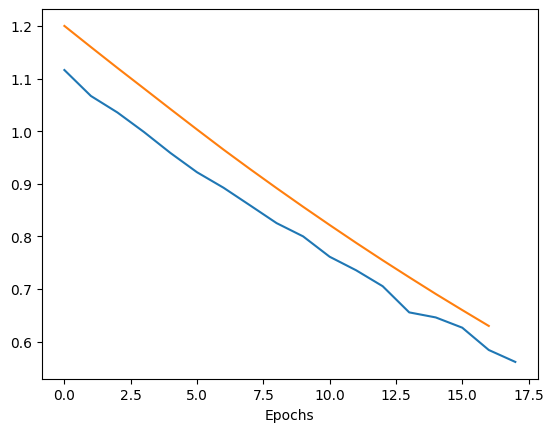

In [ ]:
#gráfico
import matplotlib.pyplot as plt

fig = plt.figure()
plt.plot(loss_train[1:])
plt.plot(loss_eval[1:])
plt.xlabel('Epochs')
plt.show()

In [ ]:
import sklearn.metrics as metrics
model.to(device)

MobileNetV3(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      (2): Hardswish()
    )
    (1): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
        (1): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
        )
      )
    )
    (2): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1), bi

In [ ]:
model.eval()
lres = []
ytrue = []
with torch.no_grad():
    for data,target in dl_test:
        data = data.to(device)
        pred = model(data)
        res  = pred.argmax(dim=1).cpu().tolist()
        lres += res
        ytrue += target

In [ ]:
#matriz
metrics.confusion_matrix(ytrue,lres)

array([[34,  0,  0],
       [ 0, 32,  0],
       [ 5,  3, 24]])

In [ ]:
#acuracia
metrics.accuracy_score(ytrue,lres)

0.9183673469387755

In [ ]:
metrics.precision_score(ytrue,lres, average='weighted')

0.9275323316139643

In [ ]:
metrics.recall_score(ytrue,lres, average='weighted')

0.9183673469387755

In [ ]:
metrics.f1_score(ytrue,lres, average='weighted')

0.9149690661672268

In [ ]:
print(metrics.classification_report(ytrue,lres))

              precision    recall  f1-score   support

           0       0.87      1.00      0.93        34
           1       0.91      1.00      0.96        32
           2       1.00      0.75      0.86        32

    accuracy                           0.92        98
   macro avg       0.93      0.92      0.91        98
weighted avg       0.93      0.92      0.91        98



# Vizualização das imagens e predição

In [ ]:
image_loader = lambda x: Image.open(x).convert('RGB')

In [106]:
img = image_loader('./abobrinha_paulista/20241023_142655.jpg')

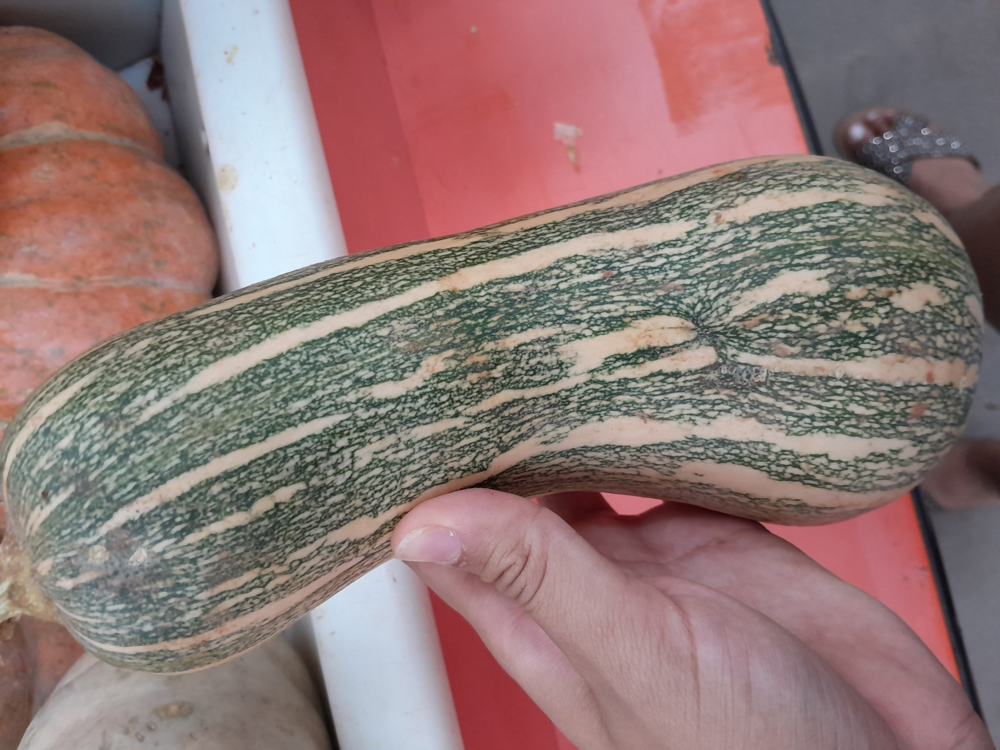

In [107]:
img

In [108]:
x = transform(img)

In [109]:
x.shape

torch.Size([3, 224, 224])

In [110]:
x = x.to(device)

In [111]:
# Add a batch dimension to the input tensor 'x' before passing it to the model
x = x.unsqueeze(0)

In [112]:
pred = model(x)

In [113]:
pred

tensor([[-0.2279, -0.2135,  0.1241]], device='cuda:0',
       grad_fn=<AddmmBackward0>)